# Prevendo Valores de Imóveis de Boston

---



  Todos os ano, milhares de imóveis são adiquiridos, para quem deseja comprar um imóvel, é razoável informar-se corretamente sobre o valor de mercado, tarefa um tanto complicada, as vezes baseada em índices como o metro quadrado, ou até mesmo por especulação. Destes, há vários em divulgação, e nem sempre o confronto entre eles permite concluir qual o preço justo, para comprador e vendedor.


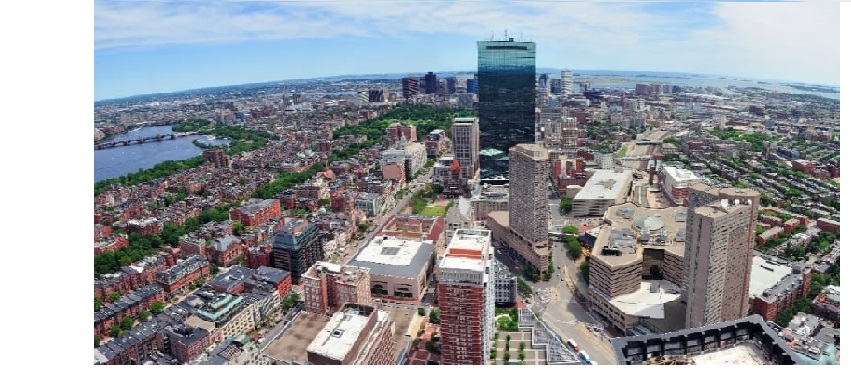

  Várias pessoas tem problemas para encontrar um valor justo em diferentes lugares da cidade. Esse projeto tem como objetivo, realizar a previsão do valor dos preços de imóveis. Para título de exemplo, os dados da cidade de Boston foi utilizada para realizar todas as análises e treino de algoritmo de Machine Learning.

#### Importando as bibliotecas necessárias

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from pandas_profiling import ProfileReport
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from math import sqrt

In [2]:
arquivo = '/content/HousingData.csv'
data = pd.read_csv(arquivo)

In [3]:
data.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,NaN,36.2


**Conhecendo as colunas da base de dados**

**CRIM:** Taxa de criminalidade per capita por região

**ZN:** Proporção de terrenos residenciais dividido por lotes com mais de 25.000 pés quadrados

**INDUS:** Proporção de hectares de negócio não comerciais por região

**CHAS:** Informação se a casa fica as margens de um rio (1 = sim, 0 = não)

**NOX:** Concentração de óxido de nítrico (partes por 10 milhões)

**RM:** Número médio de quartos entre as casas do bairro

**AGE:** Proporção de unidades ocupadas pelos propietários, contruídas antes de 1940

**DIS:** Distância ponderada para cinco regiões de emprego em Boston

**RAD:** Índice de acessibilidade às rodovias

**TAX:** Taxa de imposto sobre o valor da propiedade

**B:** 1000(Bk - 0,63)², onde Bk é a proporção de pessoas de descendência afro-americana por cidade

**PTRATIO:** Bairros com maior proporção de alunos para professores

**LSTAT:** Porcentagem de ststus mais baixo da população

**MEDV:** Valor médio de casas ocupadas pelos propietários em US$ 1000








### Análise exploratória de dados

In [4]:
relatorio = ProfileReport(data, title='Relatório - Casas Boston')
relatorio.to_notebook_iframe()
relatorio.to_file('relatorio_casas.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

**OBS: Todo o relatório está nesse repositório**

Nome do arquivo: **relatorio_casas.html**

Observações



*   O coeficiente de correlação varia de -1 a 1. Se o valor é próximo de 1, isto significa que existe uma forte correlação positiva entre as variáveis. Quando esse número é próximo de -1, as variáveis tem uma forte correlação negaiva.
*   O relatório mostra que a variável alvo(**MEDV**) é fortemente correlacionada com as variáveis **LSTAT** e **RM**.
*   RAD e TAX são fortemente correlacionadas, podemos remove-las do nosso modelo para evitar a multi-colinearidade.
*   O mesmo ocorre com as colunas DIS e AGE a qual tem a correlação de -0.75.
*   A coluna ZN possui 73% de valores zero.



**Verificando valores nulos**

In [6]:
data.isnull().sum()

CRIM       20
ZN         20
INDUS      20
CHAS       20
NOX         0
RM          0
AGE        20
DIS         0
RAD         0
TAX         0
PTRATIO     0
B           0
LSTAT      20
MEDV        0
dtype: int64

**Excluindo valores nulos**

In [7]:
data = data.dropna(axis=0)

In [8]:
data.isnull().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
MEDV       0
dtype: int64

**Abaixo, temos alguns dados estatísticos da base de dados**

In [9]:
data.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,394.000000,394.000000,394.000000,394.000000,394.000000,394.000000,394.000000,394.000000,394.000000,394.000000,394.000000,394.000000,394.000000,394.000000
mean,3.690136,11.460660,11.000863,0.068528,0.553215,6.280015,68.932741,3.805268,9.403553,406.431472,18.537563,358.490939,12.769112,22.359645
std,9.202423,23.954082,6.908364,0.252971,0.113112,0.697985,27.888705,2.098571,8.633451,168.312419,2.166460,89.283295,7.308430,9.142979
min,0.006320,0.000000,0.460000,0.000000,0.389000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,2.600000,1.730000,5.000000
25%,0.081955,0.000000,5.130000,0.000000,0.453000,5.879250,45.475000,2.110100,4.000000,280.250000,17.400000,376.707500,7.125000,16.800000
50%,0.268880,0.000000,8.560000,0.000000,0.538000,6.201500,77.700000,3.199200,5.000000,330.000000,19.100000,392.190000,11.300000,21.050000
75%,3.435973,12.500000,18.100000,0.000000,0.624000,6.605500,94.250000,5.116700,24.000000,666.000000,20.200000,396.900000,17.117500,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


In [10]:
correlacoes = data.corr()

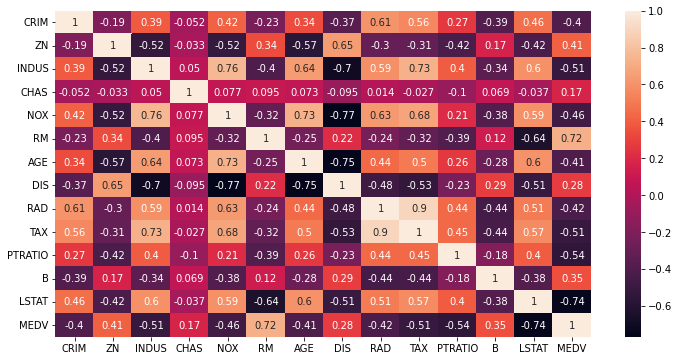

In [11]:
plt.figure(figsize=(12, 6))
sns.heatmap(data=correlacoes, annot=True)

**Visualizando a relação entre algumas features e variável alvo**


> Número de quartos e valor médio do imóvel



In [ ]:
fig = px.scatter(data, x=data.RM, y=data.MEDV)
fig.show()

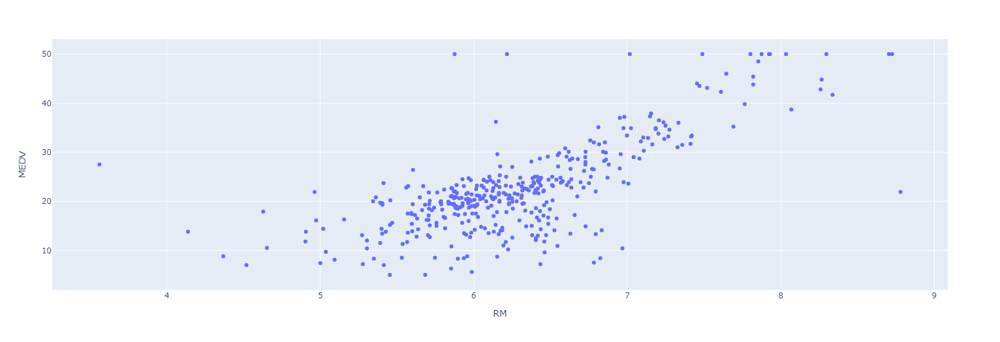



> Índice de status mais baixo da população e proço do imóvel



In [ ]:
fig = px.scatter(data, x=data.LSTAT, y=data.MEDV)
fig.show()

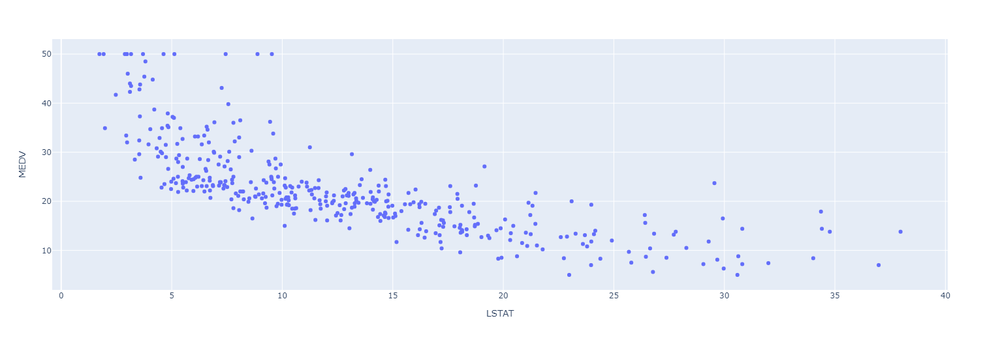



> Percentual de proporção de alunos para professores



In [ ]:
fig = px.scatter(data, x=data.PTRATIO, y=data.MEDV)
fig.show()

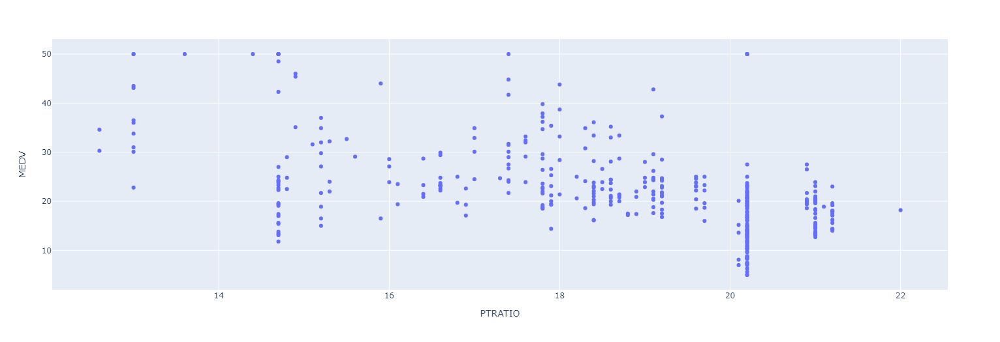

**Análise de Outliers**



> Análise descritiva da variável RM



In [15]:
data['RM'].describe()

count    394.000000
mean       6.280015
std        0.697985
min        3.561000
25%        5.879250
50%        6.201500
75%        6.605500
max        8.780000
Name: RM, dtype: float64



> Distribuição da variável RM



In [ ]:
labels = ['Distribuição da variável RM (número de quartos)']
fig = ff.create_distplot([data.RM], labels, bin_size=.2)
fig.show()

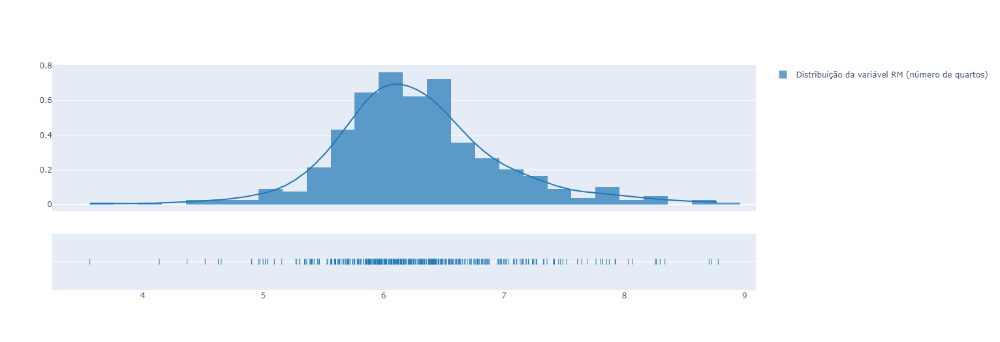



> Visualizando outliers na variável RM



In [ ]:
fig = px.box(data, y='RM')
fig.update_layout(width= 800, height=800)
fig.show()

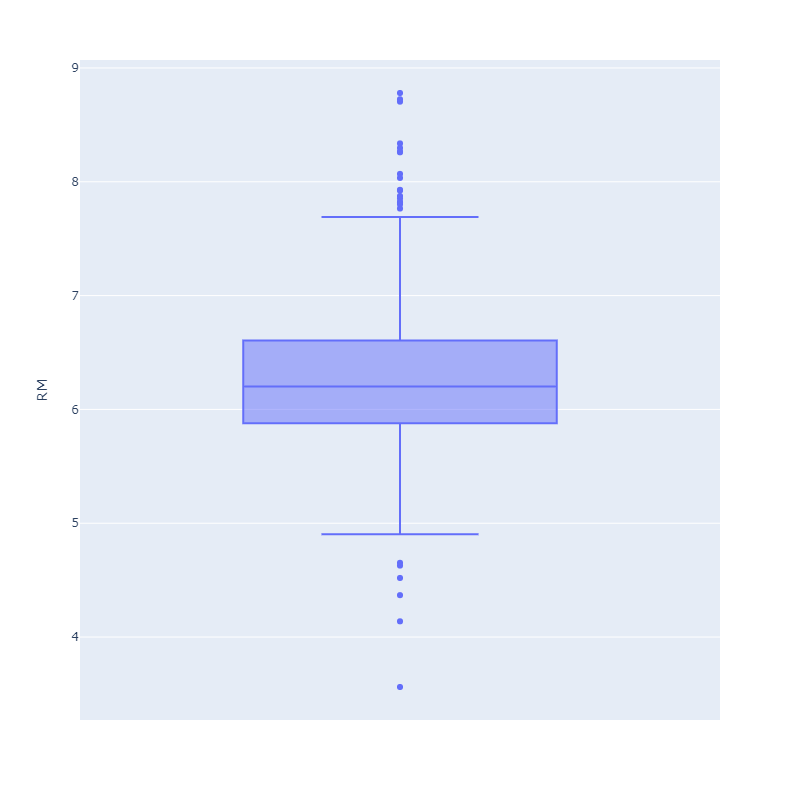



> Visualizando a distribuição da variável MEDV



In [18]:
data['MEDV'].describe()

count    394.000000
mean      22.359645
std        9.142979
min        5.000000
25%       16.800000
50%       21.050000
75%       25.000000
max       50.000000
Name: MEDV, dtype: float64

In [ ]:
labels = ['Distribuição da variável MEDV (Preço médio do imóvel)']
fig = ff.create_distplot([data.MEDV], labels, bin_size=.2)
fig.show()

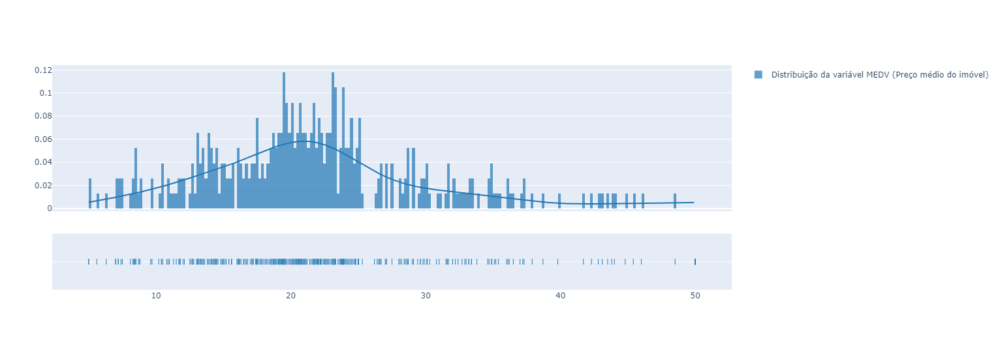



> Coeficiente de Pearson



In [20]:
stats.skew(data.MEDV)

1.061883757342733

**Coeficiente de Pearson**

- Valor entre -1 e 1 - distribuição simétrica
- Valor maior que 1 - distribuição assimétrica positiva
- Valor menor que -1 - distribuição assimétrica negativa



> Histograma da variável MEDV (variável alvo)



In [ ]:
fig = px.histogram(data, x='MEDV', nbins=50, opacity=0.50)
fig.show()

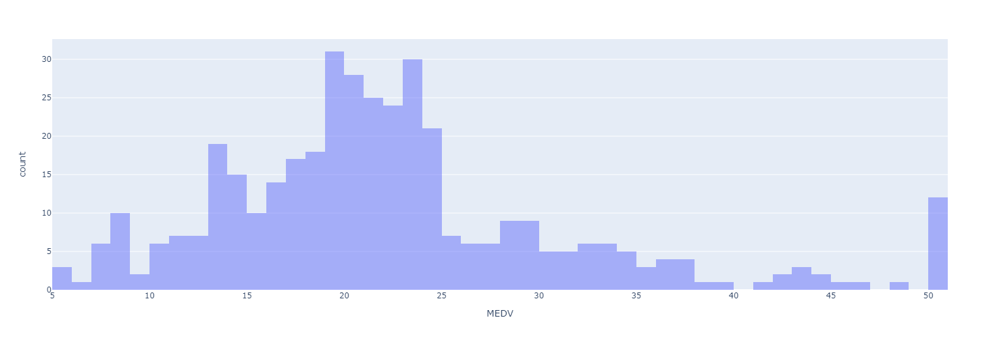



> Visualizando outliers na variável MEDV



In [ ]:
fig = px.box(data, y='MEDV')
fig.update_layout(width=800, height=800)
fig.show()

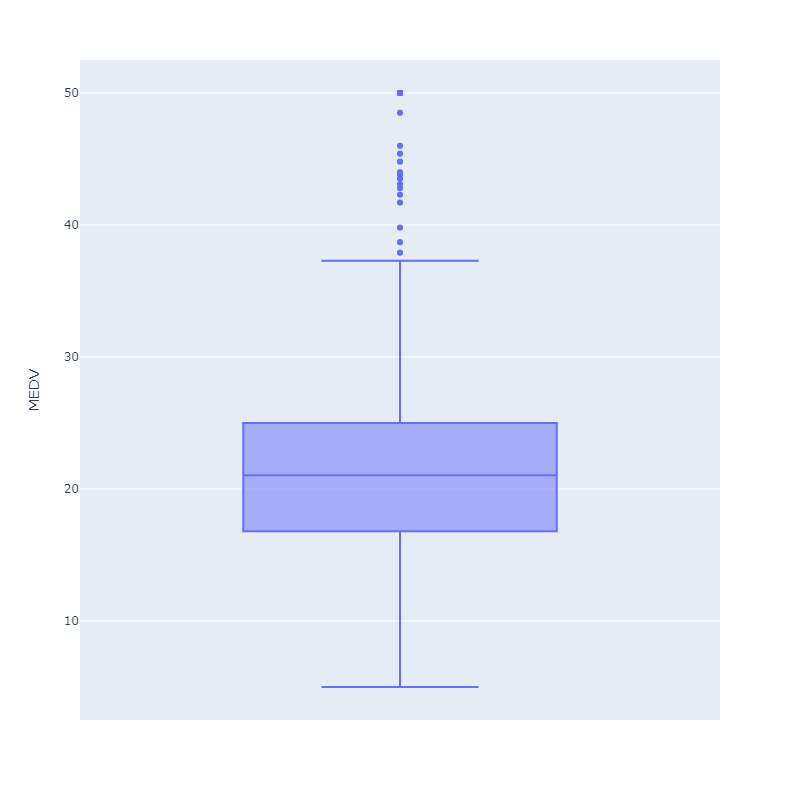



> Estatística descritiva das variáveis



In [23]:
data[['PTRATIO', 'LSTAT', 'RM']].describe()

,PTRATIO,LSTAT,RM
count,394.000000,394.000000,394.000000
mean,18.537563,12.769112,6.280015
std,2.166460,7.308430,0.697985
min,12.600000,1.730000,3.561000
25%,17.400000,7.125000,5.879250
50%,19.100000,11.300000,6.201500
75%,20.200000,17.117500,6.605500
max,22.000000,37.970000,8.780000




> Imprimindo os 16 maiores valores de MEDV



In [24]:
data[['PTRATIO', 'LSTAT', 'RM', 'MEDV']].nlargest(16, 'MEDV')

,PTRATIO,LSTAT,RM,MEDV
161,14.7,1.73,7.489,50.0
162,14.7,1.92,7.802,50.0
166,14.7,3.70,7.929,50.0
195,14.4,2.97,7.875,50.0
204,14.7,2.88,8.034,50.0
225,17.4,4.63,8.725,50.0
257,13.0,5.12,8.704,50.0
267,13.0,7.44,8.297,50.0
283,13.6,3.16,7.923,50.0
370,20.2,2.96,7.016,50.0


In [25]:
top16 = data.nlargest(16, 'MEDV').index



> Remove os valores listados do top 16



In [26]:
data.drop(top16, inplace=True)



> Visualizando a distribuição da variável MEDV



In [ ]:
labels = ['Distribuição da variável MEDV (Preço médio do imóvel)']
fig = ff.create_distplot([data.MEDV], labels, bin_size=.2)
fig.show()

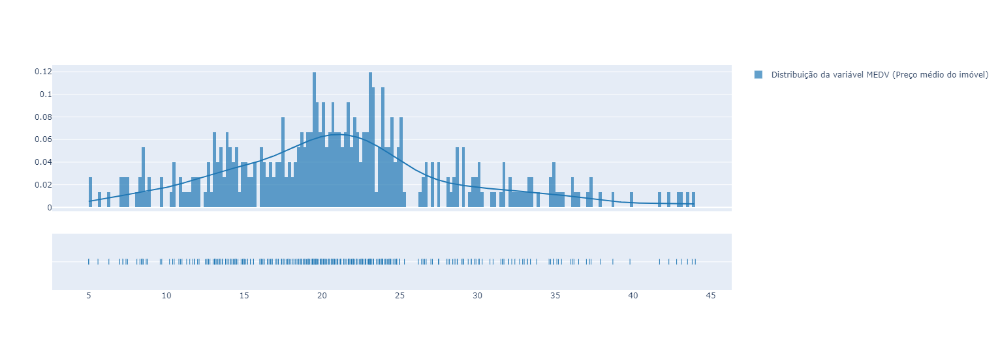

In [ ]:
fig = px.histogram(data, x='MEDV', nbins=50, opacity=0.50)
fig.show()

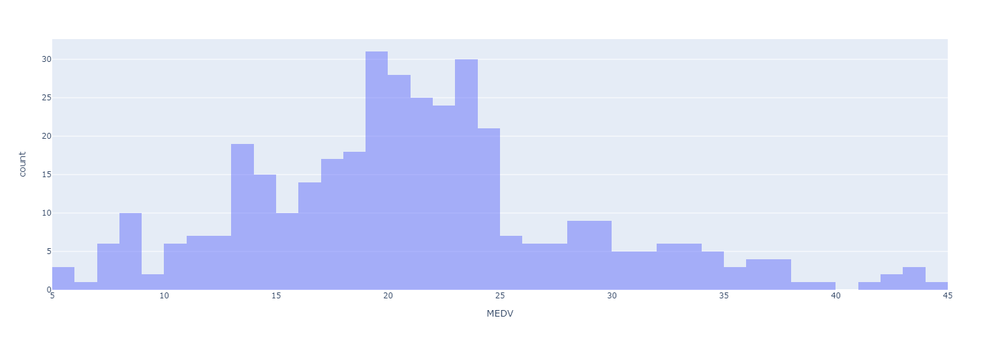



> Coeficiente de Pearson



In [29]:
stats.skew(data.MEDV)

0.5266338736283297

**Definindo um Baseline**

- Uma baseline é importante para ter marcos no projeto.
- Permite uma explicação fácil para todos os envolvidos
- É algo que sempre tentaremos ganhar na medida do possível.

In [30]:
# Converter os dados
data['RM'] = data['RM'].astype(int)

In [31]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 378 entries, 0 to 504
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     378 non-null    float64
 1   ZN       378 non-null    float64
 2   INDUS    378 non-null    float64
 3   CHAS     378 non-null    float64
 4   NOX      378 non-null    float64
 5   RM       378 non-null    int64  
 6   AGE      378 non-null    float64
 7   DIS      378 non-null    float64
 8   RAD      378 non-null    int64  
 9   TAX      378 non-null    int64  
 10  PTRATIO  378 non-null    float64
 11  B        378 non-null    float64
 12  LSTAT    378 non-null    float64
 13  MEDV     378 non-null    float64
dtypes: float64(11), int64(3)
memory usage: 44.3 KB


In [32]:
data.RM.describe()

count    378.000000
mean       5.714286
std        0.712047
min        3.000000
25%        5.000000
50%        6.000000
75%        6.000000
max        8.000000
Name: RM, dtype: float64



> Código que realiza a classificação, e categoriza os imóveis em: Pequeno, Médio e Grande. Leva em consideração a média do número de quartos do imóvel.



In [33]:
categorias = []
for i in data.RM.iteritems():
    valor = (i[1])
    if valor <= 4:
        categorias.append('Pequeno')
    elif valor < 7:
        categorias.append('Médio')
    else:
        categorias.append('Grande')



> Criação da coluna "Catergorias"



In [34]:
#Cria coluna categoria
data['categorias'] = categorias

In [35]:
data['categorias'].value_counts()

Médio      331
Grande      37
Pequeno     10
Name: categorias, dtype: int64



> Agrupando as categorias e calcula as médias



In [36]:
medias_categorias = data.groupby(by='categorias')['MEDV'].mean()

In [37]:
medias_categorias

categorias
Grande     35.051351
Médio      19.876133
Pequeno    14.910000
Name: MEDV, dtype: float64



> Criando o dicionário das categorias pequeno, médio e grande. Com seus respectivos valores



In [38]:
dic_baseline = {'Grande': medias_categorias[0], 'Médio': medias_categorias[1], 'Pequeno': medias_categorias[2]}

In [39]:
dic_baseline

{'Grande': 35.05135135135136, 'Médio': 19.876132930513595, 'Pequeno': 14.91}



> Cria a função que retorna o baseline



In [40]:
def retorna_baseline(num_quartos):
    if num_quartos <= 4:
        return dic_baseline.get('Pequeno')
    elif num_quartos < 7:
        return dic_baseline.get('Médio')
    else:
        return dic_baseline.get('Grande')

In [41]:
for i in data.RM.iteritems():
    n_quartos = i[1]
    print(f'Número de quartos é: {n_quartos}, Valor médio: {retorna_baseline(n_quartos)}')

Número de quartos é: 6, Valor médio: 19.876132930513595
Número de quartos é: 6, Valor médio: 19.876132930513595
Número de quartos é: 7, Valor médio: 35.05135135135136
Número de quartos é: 6, Valor médio: 19.876132930513595
Número de quartos é: 6, Valor médio: 19.876132930513595
Número de quartos é: 6, Valor médio: 19.876132930513595
Número de quartos é: 5, Valor médio: 19.876132930513595
Número de quartos é: 6, Valor médio: 19.876132930513595
Número de quartos é: 6, Valor médio: 19.876132930513595
Número de quartos é: 5, Valor médio: 19.876132930513595
Número de quartos é: 5, Valor médio: 19.876132930513595
Número de quartos é: 5, Valor médio: 19.876132930513595
Número de quartos é: 5, Valor médio: 19.876132930513595
Número de quartos é: 5, Valor médio: 19.876132930513595
Número de quartos é: 5, Valor médio: 19.876132930513595
Número de quartos é: 5, Valor médio: 19.876132930513595
Número de quartos é: 5, Valor médio: 19.876132930513595
Número de quartos é: 5, Valor médio: 19.876132930

In [42]:
data.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV,categorias
0,0.00632,18.0,2.31,0.0,0.538,6,65.2,4.0900,1,296,15.3,396.90,4.98,24.0,Médio
1,0.02731,0.0,7.07,0.0,0.469,6,78.9,4.9671,2,242,17.8,396.90,9.14,21.6,Médio
2,0.02729,0.0,7.07,0.0,0.469,7,61.1,4.9671,2,242,17.8,392.83,4.03,34.7,Grande
3,0.03237,0.0,2.18,0.0,0.458,6,45.8,6.0622,3,222,18.7,394.63,2.94,33.4,Médio
5,0.02985,0.0,2.18,0.0,0.458,6,58.7,6.0622,3,222,18.7,394.12,5.21,28.7,Médio


### Trabalhando com Baseline



> Preparando os dados



In [43]:
#Remove as colunas colineares, variáveis alvo e a coluna categorias
X = data.drop(['RAD', 'TAX', 'MEDV', 'DIS', 'AGE', 'ZN','categorias'], axis=1)

In [44]:
# Variável 'y' é a variável alvo
y = data['MEDV']

In [45]:
X.head()

,CRIM,INDUS,CHAS,NOX,RM,PTRATIO,B,LSTAT
0,0.00632,2.31,0.0,0.538,6,15.3,396.90,4.98
1,0.02731,7.07,0.0,0.469,6,17.8,396.90,9.14
2,0.02729,7.07,0.0,0.469,7,17.8,392.83,4.03
3,0.03237,2.18,0.0,0.458,6,18.7,394.63,2.94
5,0.02985,2.18,0.0,0.458,6,18.7,394.12,5.21


In [46]:
y.head()

0    24.0
1    21.6
2    34.7
3    33.4
5    28.7
Name: MEDV, dtype: float64

**Separando os dados de treino e teste**



> Base de dados: 80% para treino e 20% para teste



In [47]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [48]:
print(f'X_train: número de linhas e colunas: {X_train.shape}')
print(f'X_test: número de linhas e colunas: {X_test.shape}')
print(f'y_train: número de linhas e colunas: {y_train.shape}')
print(f'y_test: número de linhas e colunas: {y_test.shape}')

X_train: número de linhas e colunas: (302, 8)
X_test: número de linhas e colunas: (76, 8)
y_train: número de linhas e colunas: (302,)
y_test: número de linhas e colunas: (76,)


### Modelo de baseline

In [49]:
X_test.head()

,CRIM,INDUS,CHAS,NOX,RM,PTRATIO,B,LSTAT
175,0.06664,4.05,0.0,0.510,6,16.6,390.96,5.33
291,0.07886,4.95,0.0,0.411,7,19.2,396.90,3.56
106,0.17120,8.56,0.0,0.520,5,20.9,395.67,18.66
212,0.21719,10.59,1.0,0.489,5,18.6,390.94,16.03
122,0.09299,25.65,0.0,0.581,5,19.1,378.09,17.93


In [50]:
predicoes = []



> Para cada elemento do teste alimenta a lista de predições



In [51]:
for i in X_test.RM.iteritems():
    n_quartos = i[1]
    predicoes.append(retorna_baseline(n_quartos))

Imprimindo as 10 primeiras linhas dos valores de baseline

In [52]:
predicoes[:10]

[19.876132930513595,
 35.05135135135136,
 19.876132930513595,
 19.876132930513595,
 19.876132930513595,
 19.876132930513595,
 35.05135135135136,
 19.876132930513595,
 19.876132930513595,
 19.876132930513595]

**Atribuindo resultados a um dataframe**

- Manteremos um log ao longo do projeto
- Permite a evolução dado o baseline

In [53]:
df_results = pd.DataFrame()

In [54]:
df_results['valor_real'] = y_test.values

In [55]:
df_results['valor_predito_baseline'] = predicoes

In [56]:
df_results.head()

,valor_real,valor_predito_baseline
0,29.4,19.876133
1,37.3,35.051351
2,19.5,19.876133
3,22.4,19.876133
4,20.5,19.876133




> Plota o valor real e o valor predito do Baseline



In [ ]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_results.index,
                         y = df_results.valor_real,
                         mode = 'lines+markers',
                         name = 'Valor Real'))

fig.add_trace(go.Scatter(x=df_results.index,
                         y=df_results.valor_predito_baseline,
                         mode = 'lines+markers',
                         name = 'v=Valor predito Baseline'))

fig.show()

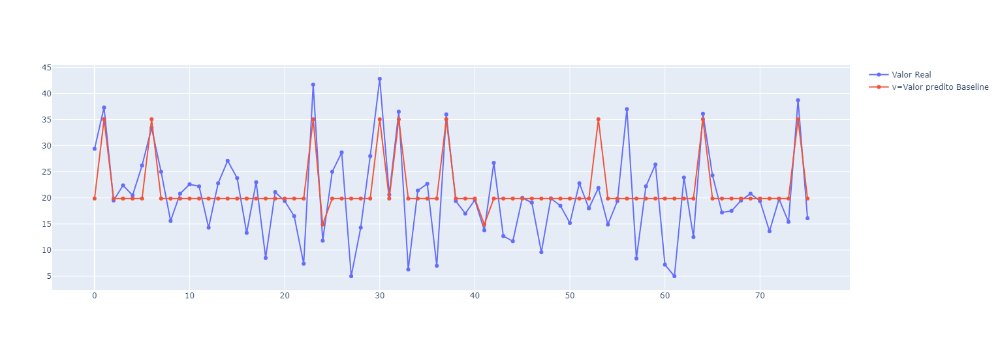

### Avaliação do modelo baseline



> Avaliando o erro médio quadrático



In [58]:
rmse = (np.sqrt(mean_squared_error(y_test, predicoes)))

In [59]:
print('Performance do modelo baseline:')
print(f'\nRMSE é: {rmse}')

Performance do modelo baseline:

RMSE é: 6.411591333588707


## Machine Learning

**Regressão Linear**

- Devido a correlação entre algumas features poemos usar uma regressão linear
- Modelo simples e eficiente
- Solução rápida e robusta



> Instanciando o modelo



In [60]:
lin_model = LinearRegression()



> Treinando o modelo



In [61]:
lin_model.fit(X_train, y_train)

LinearRegression()



> Modelo realizando a predição



In [62]:
y_pred = lin_model.predict(X_test)



> Avaliando o erro médio quadrático



In [63]:
rmse = (np.sqrt(mean_squared_error(y_test, y_pred)))

In [64]:
print('Performance do modelo avaliado com dados de teste:')
print(f'\nRMSE é: {rmse}')

Performance do modelo avaliado com dados de teste:

RMSE é: 3.86895686350017




> Salvando os resultados



In [65]:
df_results['valor_predito_reg_linear'] = lin_model.predict(X_test)

In [66]:
df_results.head()

,valor_real,valor_predito_baseline,valor_predito_reg_linear
0,29.4,19.876133,27.668599
1,37.3,35.051351,29.454008
2,19.5,19.876133,15.912410
3,22.4,19.876133,21.129173
4,20.5,19.876133,16.187362




> Plota o valor real, valor predito do Baseline e o valor da Regressão Linear



In [ ]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_results.index,
                         y = df_results.valor_real,
                         mode = 'lines+markers',
                         name = 'Valor Real'))

fig.add_trace(go.Scatter(x=df_results.index,
                         y=df_results.valor_predito_baseline,
                         mode = 'lines+markers',
                         name = 'Valor predito Baseline'))

fig.add_trace(go.Scatter(x=df_results.index,
                         y=df_results.valor_predito_reg_linear,
                         mode = 'lines',
                         line = dict(color = '#FEBFB3'),
                         name = 'Valor predito Regressão Linear'))

fig.show()

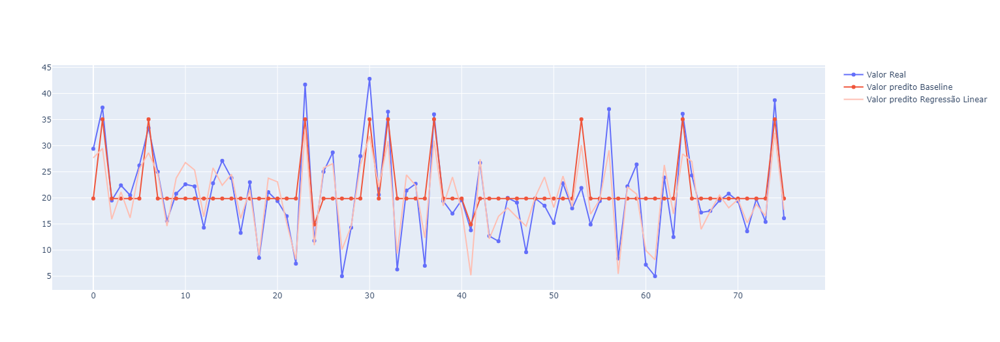

**Árvores de decisão**

- Algoritmo de aprendizado supervisionado
- Explicabilidade do Modelo é simples


Instanciando o algoritmo de Árvore de decisão

In [68]:
regressor = DecisionTreeRegressor()

Treinando o modelo

In [69]:
regressor.fit(X_train, y_train)

DecisionTreeRegressor()

Modelo realizando a predição

In [70]:
y_pred = regressor.predict(X_test)



> Salvando os resultados



In [71]:
df_results['valor_predito_arvore'] = y_pred

In [72]:
df_results.head()

,valor_real,valor_predito_baseline,valor_predito_reg_linear,valor_predito_arvore
0,29.4,19.876133,27.668599,29.9
1,37.3,35.051351,29.454008,34.9
2,19.5,19.876133,15.912410,16.7
3,22.4,19.876133,21.129173,20.7
4,20.5,19.876133,16.187362,23.7


Plota o valor real, valor predito do Baseline, valor da Regressão Linear e o valor da Árvore de decisão





In [ ]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_results.index,
                         y = df_results.valor_real,
                         mode = 'lines+markers',
                         name = 'Valor Real'))

fig.add_trace(go.Scatter(x=df_results.index,
                         y=df_results.valor_predito_baseline,
                         mode = 'lines+markers',
                         name = 'Valor predito Baseline'))

fig.add_trace(go.Scatter(x=df_results.index,
                         y=df_results.valor_predito_reg_linear,
                         mode = 'lines',
                         line = dict(color = '#FEBFB3'),
                         name = 'Valor predito Regressão Linear'))

fig.add_trace(go.Scatter(x=df_results.index,
                         y=df_results.valor_predito_arvore,
                         mode = 'lines+markers',
                         name = 'Valor predito Arvore'))

fig.show()

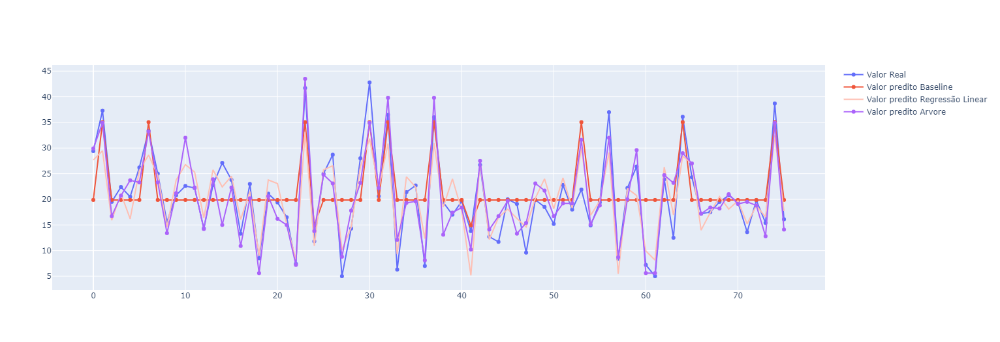



> Avaliando o erro médio quadrático



In [74]:
rmse = (np.sqrt(mean_squared_error(y_test, y_pred)))

In [75]:
print('Performance do modelo avaliado com dados de teste:')
print(f'\nRMSE é: {rmse}')

Performance do modelo avaliado com dados de teste:

RMSE é: 3.8118582289868463


**Random Forest**

- Método Ensemble
- Mais robustez para os modelos



> Instanciando o algoritmo Random Forest



In [76]:
rf_regressor = RandomForestRegressor()



> Treinando o modelo



In [77]:
rf_regressor.fit(X_train, y_train)

RandomForestRegressor()



> Modelo realizando a predição


In [78]:
y_pred = rf_regressor.predict(X_test)



> Salvando os resultados


In [79]:
df_results['valor_predito_random_forest'] = y_pred

In [80]:
df_results.head()

,valor_real,valor_predito_baseline,valor_predito_reg_linear,valor_predito_arvore,valor_predito_random_forest
0,29.4,19.876133,27.668599,29.9,27.952
1,37.3,35.051351,29.454008,34.9,38.541
2,19.5,19.876133,15.912410,16.7,18.018
3,22.4,19.876133,21.129173,20.7,20.376
4,20.5,19.876133,16.187362,23.7,19.137




> Plota o valor real, valor predito do Baseline, valor da Regressão Linear, valor da Árvore de decisão e o valor Random Forest




In [ ]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_results.index,
                         y = df_results.valor_real,
                         mode = 'markers',
                         name = 'Valor Real'))

fig.add_trace(go.Scatter(x=df_results.index,
                         y=df_results.valor_predito_baseline,
                         mode = 'lines+markers',
                         name = 'Valor predito Baseline'))

fig.add_trace(go.Scatter(x=df_results.index,
                         y=df_results.valor_predito_reg_linear,
                         mode = 'lines',
                         line = dict(color = '#FEBFB3'),
                         name = 'Valor predito Regressão Linear'))

fig.add_trace(go.Scatter(x=df_results.index,
                         y=df_results.valor_predito_arvore,
                         mode = 'lines+markers',
                         name = 'Valor predito Arvore'))

fig.add_trace(go.Scatter(x=df_results.index,
                         y=df_results.valor_predito_random_forest,
                         mode = 'lines+markers',
                         name = 'Valor predito Random Forest'))

fig.show()

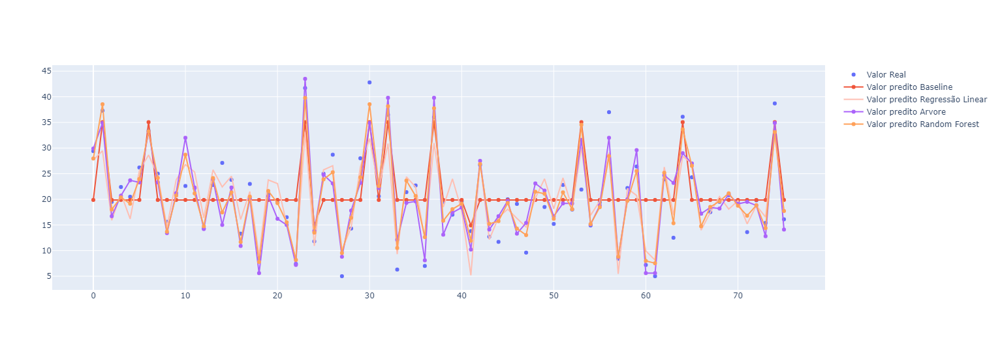



> Avaliando o erro médio quadrático



In [82]:
rmse = (np.sqrt(mean_squared_error(y_test, y_pred)))

In [83]:
print('Performance do modelo avaliado com dados de teste:')
print(f'\nRMSE é: {rmse}')

Performance do modelo avaliado com dados de teste:

RMSE é: 3.0934870398612424


### Tunning dos algoritmos



> Como observado, o algoritmo Random Forest obteve o melhor desempenho entre todos os algoritmos de machine learning e o baseline. Vamos utilizar para realizar as predições



- O parâmetro n_estimators define a quantidade de árvores de serão usadas para criação dos modelos. Quanto maior o número de árvores, maior será o número de modelos no ensemble.
- O parâmetro max_deph define a profundidade da árvore, quanto mais profunda a árvore, mais especializado nos dados
de treino o nosso modelo estará.
- O parâmetro max_features define a quantidade máxima de nós que serão usados para separar os níveis folha da árvore

**rf_regressor = RandomForestRegressor(n_estimators=200, max_depth=7, max_features=3)**

## Deploy da Aplicação

In [84]:
X['MEDV'] = y

In [85]:
X.head()

,CRIM,INDUS,CHAS,NOX,RM,PTRATIO,B,LSTAT,MEDV
0,0.00632,2.31,0.0,0.538,6,15.3,396.90,4.98,24.0
1,0.02731,7.07,0.0,0.469,6,17.8,396.90,9.14,21.6
2,0.02729,7.07,0.0,0.469,7,17.8,392.83,4.03,34.7
3,0.03237,2.18,0.0,0.458,6,18.7,394.63,2.94,33.4
5,0.02985,2.18,0.0,0.458,6,18.7,394.12,5.21,28.7


In [86]:
X.to_csv('data.csv', index=False)

  Logo depois de todo o trabalho de análise, exploração e machine learning com os dados, foi realizado uma aplicação web com interface gráfica para o usuário realizar as entradas de dados, e o algoritmo de machine learning realizar a previsão. 
  Em breve essa aplicação estará online pra usuários externos!

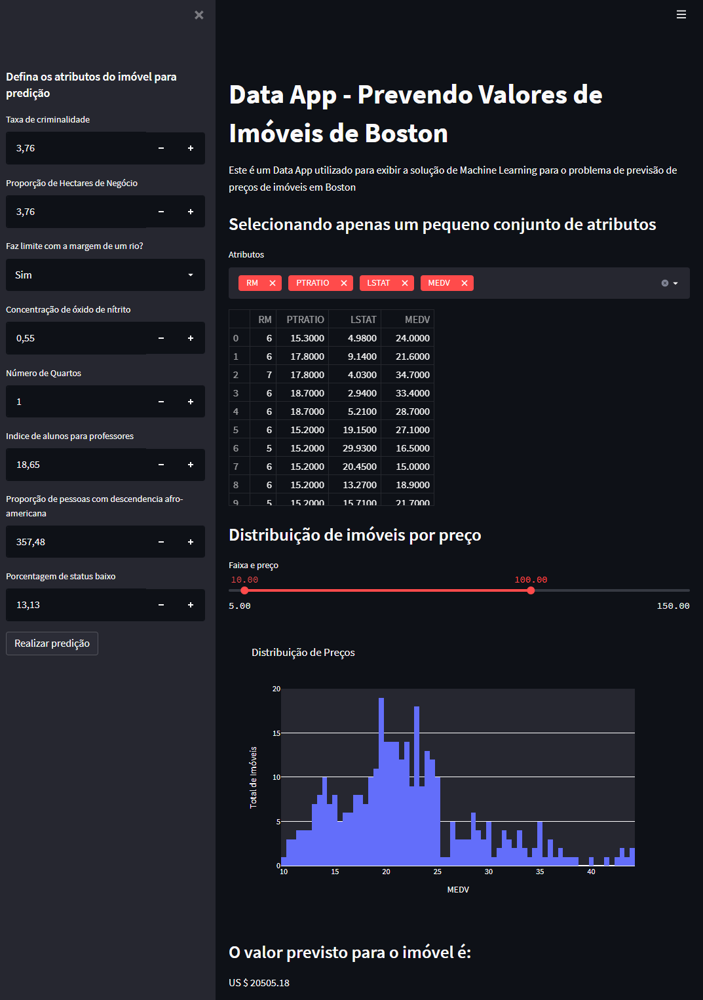